In [3]:
%matplotlib inline

# Huge-scale simulation using Chicago-Sketch dataset

In this example, we demonstrate how UXsim can be used for huge-scale simulation in metropolitan area. We use [Chicago-Sketch](https://github.com/bstabler/TransportationNetworks/tree/master/Chicago-Sketch) dataset provided by Transportation Networks for Research. The scenario data for UXsim is derived from the original TNTP dataset and provided as [chicago_sketch.uxsim_scenario](https://github.com/toruseo/UXsim/blob/main/dat/chicago_sketch.uxsim_scenario) at UXsim repo. The code generated UXsim scenario file is attached to the end of this notebook.

The dataset contains an abstract road network of Chicago metropolitan area with 546 nodes and 2176 links. The traffic demand is almost 1 million vehicles for 1 hour in the peak period. Note that the data is modified from the original dataset in order to make them suitable for UXsim.

With this scale, we cannot simulate each individual vehicle one by one due to extremely high computational cost. Instead, by leveraging the mesoscopic nature of UXsim, we aggregate some vehicles into 1 platoon and simulate their behavior. This is achieved by changing `deltan` argument of `World`. This is very efficient approach as it does not only reduce the number of agents, but also reduce the number of time steps for the same time duration. It is known that the underlying traffic flow model output the equivalent results for within-link traffic dynamics regardless of `deltan` value. The network-scale dynamics will change as this setting alters inter-link traffic behavior, but this can be considered as an acceptable cost for the efficiency.

## Simulation

By loading the pre-defined scenario file `dat/chicago_sketch.uxsim_scenario`, this simulation can be done easily as follows.

In [4]:
from uxsim import *

W = World(
    name="",
    deltan=30, #for huge scale simulation (e.g., 100000+ vehicles or 1000+ links), large deltan is recommended. 
    tmax=10000,
    print_mode=1, save_mode=1, show_mode=1,
    random_seed=42,
)

W.load_scenario("dat/chicago_sketch.uxsim_scenario")

W.exec_simulation()
W.analyzer.print_simple_stats()


loading scenario from 'dat/chicago_sketch.uxsim_scenario'
 DATA SOURCE AND LICENCE : Chicago-Sketch network. This is based on https://github.com/bstabler/TransportationNetworks/tree/master/Chicago-Sketch by Transportation Networks for Research Core Team. Users need to follow their licence. Especially, this data is for academic research purposes only, and users must indicate the source of any dataset they are using in any publication that relies on any of the datasets provided in this web site.
 Number of loaded nodes: 546
 Number of loaded links: 2176
 Number of loaded `adddemand`s: 8406
simulation setting:
 scenario name: 
 simulation duration:	 10000 s
 number of vehicles:	 968520 veh
 total road length:	 12115219.047323605 m
 time discret. width:	 30 s
 platoon size:		 30 veh
 number of timesteps:	 333
 number of platoons:	 32284
 number of links:	 2176
 number of nodes:	 546
 setup time:		 3.93 s
simulating...
      time| # of vehicles| ave speed| computation time
       0 s|      

You can see that the simulation finishes in about 40 seconds. Now let's visualize the results.

 generating animation...


  0%|          | 0/167 [00:00<?, ?it/s]

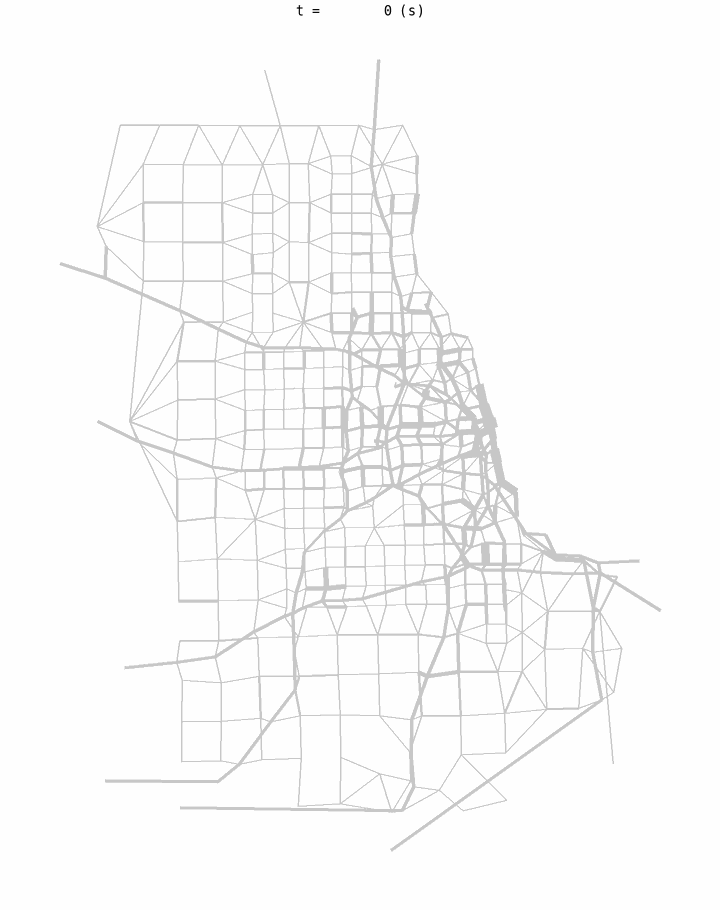

In [10]:
W.analyzer.network_fancy(animation_speed_inverse=10, sample_ratio=0.2, interval=5, trace_length=10, figsize=6, antialiasing=True)
display_image_in_notebook("out/anim_network_fancy.gif")

You can see a peak hour traffic congestion at the downtown area.

## Validation

The original TNTP dataset includes traffic volumes and travel time of every links based on static static assignment. Since *static* traffic assignment and *dynamic* traffic assignment of UXsim is substantially different, these results will not match exactly. Nevertheless, it would be worth comparing these results to see whether UXsim outputs plausible results or not.

First, read the link traffic states of UXsim.


In [11]:
df_res_link = W.analyzer.link_to_pandas()
df_res_link

,link,start_node,end_node,traffic_volume,vehicles_remain,free_travel_time,average_travel_time,stddiv_travel_time
0,387,388,390,120,90,665.400000,662.627027,2.699014
1,388,388,391,420,0,358.800000,334.594595,10.561172
2,389,388,708,90,0,174.000000,161.099099,12.496454
3,390,388,802,0,0,286.800000,-1.000000,-1.000000
4,391,389,390,30,0,260.400000,266.655856,4.573892
...,...,...,...,...,...,...,...,...
2171,2941,929,442,300,0,1322.949900,1347.969212,7.128038
2172,2943,930,518,0,0,1543.188079,-1.000000,-1.000000
2173,2945,931,906,30,0,911.461779,923.653582,8.796265
2174,2947,932,515,0,0,420.142347,-1.000000,-1.000000


And then TNTP data. 

NOTE: If you want to execute this notebook, please obtain `ChicagoSketch_flow.tntp` and place it to an appropriate path.

In [13]:
df_tntp_flow = pd.read_csv('out/ChicagoSketch_flow.tntp', sep='\t')
df_tntp_flow.columns = ["from", "to", "vol", "min"]
df_tntp_flow["sec"] = df_tntp_flow["min"]*60

display(df_tntp_flow)

,from,to,vol,min,sec
0,1,547,4989.13,0.034507,2.070408
1,2,548,6719.41,0.034507,2.070408
2,3,549,10095.53,0.034507,2.070408
3,4,550,9444.62,0.034507,2.070408
4,5,551,17223.82,0.034507,2.070408
...,...,...,...,...,...
2945,931,906,157.00,15.707724,942.463430
2946,932,386,25.00,0.034507,2.070408
2947,932,515,22.00,6.347704,380.862240
2948,933,387,5468.00,0.034507,2.070408


In [23]:
from pylab import *

res_tntp = {} #{(start_node, end_node): {}}
res_uxsim = {} #{(start_node, end_node): {}}
for i in lange(df_tntp_flow):
    res_tntp[df_tntp_flow["from"][i], df_tntp_flow["to"][i]] = {"vol": df_tntp_flow["vol"][i], "sec": df_tntp_flow["sec"][i]}
    
for i in lange(df_res_link):
    if df_res_link["traffic_volume"][i] > 0:
        res_uxsim[int(df_res_link["start_node"][i]), int(df_res_link["end_node"][i])] = {"vol": df_res_link["traffic_volume"][i], "sec": df_res_link["average_travel_time"][i]}

for key in list(res_tntp.keys()):
    if key not in res_uxsim.keys():
        del res_tntp[key]
        #print(key, end=", ")
#print("")

for key in list(res_uxsim.keys()):
    if key not in res_tntp.keys():
        del res_tntp[key]
        #print(key, end=", ")

res_tntp_vol = array([res_tntp[key]["vol"] for key in res_uxsim.keys()])
res_uxsim_vol = array([res_uxsim[key]["vol"] for key in res_uxsim.keys()])
res_tntp_sec = array([res_tntp[key]["sec"] for key in res_uxsim.keys()])
res_uxsim_sec = array([res_uxsim[key]["sec"] for key in res_uxsim.keys()])

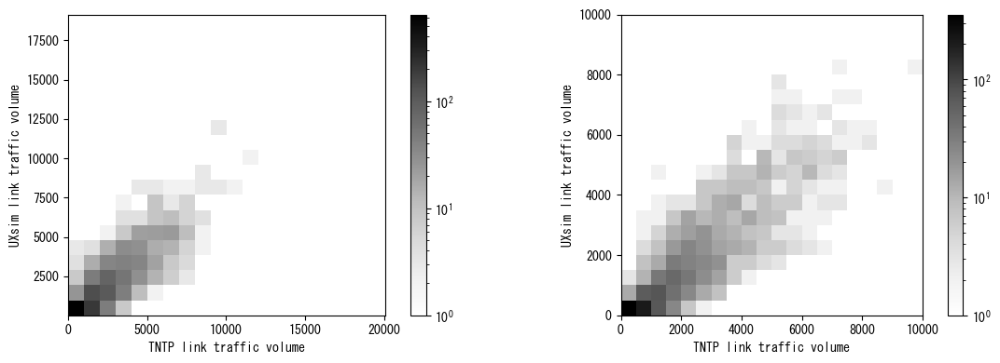

In [32]:
figure(figsize=(12,4))
subplot(121, aspect="equal")
hist2d(res_tntp_vol, res_uxsim_vol, bins=20, cmap="Greys", norm=mpl.colors.LogNorm())
colorbar()
xlabel("TNTP link traffic volume")
ylabel("UXsim link traffic volume")

subplot(122, aspect="equal")
hist2d(res_tntp_vol, res_uxsim_vol, bins=20, range=[[0,10000], [0,10000]], cmap="Greys", norm=mpl.colors.LogNorm())
colorbar()
xlabel("TNTP link traffic volume")
ylabel("UXsim link traffic volume")


tight_layout()
show()

The above figures show the comparison of link traffic volume. Roughly speaking, they are mostly correlated.

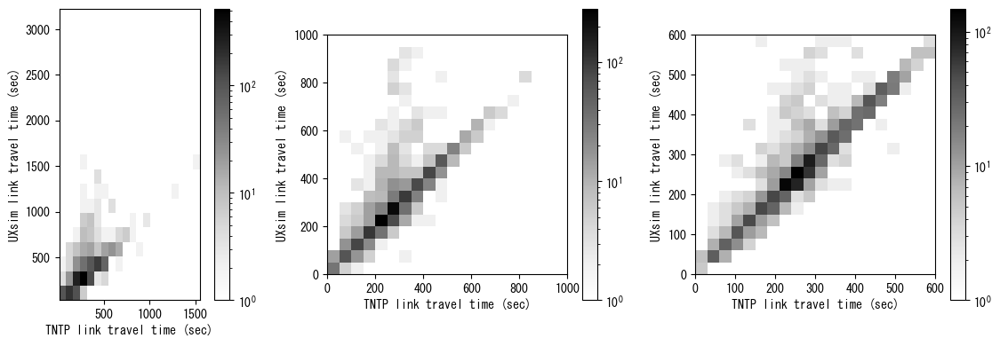

In [33]:
figure(figsize=(12,4))
subplot(131, aspect="equal")
hist2d(res_tntp_sec, res_uxsim_sec, bins=20, cmap="Greys", norm=mpl.colors.LogNorm())
xlabel("TNTP link travel time (sec)")
ylabel("UXsim link travel time (sec)")
colorbar()

subplot(132, aspect="equal")
hist2d(res_tntp_sec, res_uxsim_sec, bins=20, range=[[0,1000], [0,1000]], cmap="Greys", norm=mpl.colors.LogNorm())
xlabel("TNTP link travel time (sec)")
ylabel("UXsim link travel time (sec)")
colorbar()

subplot(133, aspect="equal")
hist2d(res_tntp_sec, res_uxsim_sec, bins=20, range=[[0,600], [0,600]], cmap="Greys", norm=mpl.colors.LogNorm())
xlabel("TNTP link travel time (sec)")
ylabel("UXsim link travel time (sec)")
colorbar()

tight_layout()
show()

The above figures show the comparison of link traffic travel time. You can see a clear 45-degree line. But this would not be an interesting result: in both of UXsim and TNTP, most of the links have very small number of users, so free-flow travel time is output. 

Another noticeable feature is that many links in UXsim experienced substantially longer travel time than TNTP. This is a reasonable result, because in dynamic traffic assignment with hard traffic capacity, traffic congestion can grow significantly if the demand was large.

Now we compare the total travel time in the entire network. As shown in below, the results are not so different. From these results, we can say that UXsim output a plausible result for this scenario.

In [35]:
print("total travel time (h)")
print("TNTP:\t", sum(res_tntp_sec*res_tntp_vol)/3600)
print("UXsim:\t", sum(res_uxsim_sec*res_uxsim_vol)/3600)

total travel time (h)
TNTP:	 311681.3229930834
UXsim:	 347367.7123302059
